<a href="https://www.kaggle.com/code/tejasposupo/solar-panel-detection-using-mask-rcnn?scriptVersionId=168671331" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

<h1 align="Center" style="font-family: Times New Roman; font-weight: bold; color: blue;"><b>Solar Panel Detection using Detectron2 F-RCNN</b></h1>


Assignment

You have been given an image file (named "given_image.jpg") that depicts a solar plant.
Your task is to outline a rectangular box around each of the fully visible solar panels in the image
and save one of the box as a separate file.

<h2 align="center" style="font-family: Times New Roman; font-size:20px; font-weight: bold; color: orange;">Importing Data & Dependencies</h2>

In [1]:
!python -m pip install pyyaml==5.1
import sys, os, distutils.core
# Note: This is a faster way to install detectron2 in Colab, but it does not include all functionalities (e.g. compiled operators).
# See https://detectron2.readthedocs.io/tutorials/install.html for full installation instructions
!git clone 'https://github.com/facebookresearch/detectron2'
dist = distutils.core.run_setup("./detectron2/setup.py")
!python -m pip install {' '.join([f"'{x}'" for x in dist.install_requires])}
sys.path.insert(0, os.path.abspath('./detectron2'))

# Properly install detectron2. (Please do not install twice in both ways)
# !python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 274.2/274.2 kB 2.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... - error
  error: subprocess-exited-with-error
  
  × python setup.py egg_info did not run successfully.
  │ exit code: 1
  ╰─> [34 lines of output]
      Traceback (most recent call last):
        File "<string>", line 2, in <module>
        File "<pip-setuptools-caller>", line 34, in <module>
        File "/tmp/pip-install-g9n17og4/pyyaml_ea2bb9b6ee28489380b4c5d0d79b872f/setup.py", line 291, in <module>
          setup(
        File "/opt/conda/lib/python3.10/site-packages/setuptools/_distutils/core.py", line 185, in setup
          return run_commands(dist)
        File "/opt/conda/lib/python3.10/site-packages/setuptools/_distutils/core.py", line 201, in run_commands
          dist.run_commands()
        File "/opt/conda/lib/python3.10/site-packages/setuptools/_distutils/dist.py", line 969, in run_commands
          self.run_command(cmd)
        File "/opt/conda/lib/

In [2]:
import torch, detectron2
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2023 NVIDIA Corporation
Built on Mon_Apr__3_17:16:06_PDT_2023
Cuda compilation tools, release 12.1, V12.1.105
Build cuda_12.1.r12.1/compiler.32688072_0
torch:  2.1 ; cuda:  2.1.2
detectron2: 0.6


In [3]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
#from google.colab.patches import cv2_imshow
from IPython.display import Image


# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

In [4]:
import numpy as np # linear algebra
import pandas as pd
import os

import torch
import torchvision
from torchvision import datasets, models
from torchvision.transforms import functional as FT
from torchvision import transforms as T
from torch import nn, optim
from torch.nn import functional as F
from torch.utils.data import DataLoader, sampler, random_split, Dataset
import copy
import math
from PIL import Image
import cv2
import albumentations as A  # our data augmentation library

import matplotlib.pyplot as plt
%matplotlib inline

# remove arnings (optional)
import warnings
warnings.filterwarnings("ignore")
from collections import defaultdict, deque
import datetime
import time
from tqdm import tqdm # progress bar
from torchvision.utils import draw_bounding_boxes


# Train on a custom dataset


<h2 align="center" style="font-family: Times New Roman; font-size:20px; font-weight: bold; color: orange;">Preparing the dataset</h2>

In [5]:
# download, decompress the data
# !wget https://github.com/matterport/Mask_RCNN/releases/download/v2.1/balloon_dataset.zip
#!unzip /content/train_old.zip -d  /content/

In [6]:
from detectron2.data.datasets import register_coco_instances
register_coco_instances("my_dataset_train", {}, "/kaggle/input/coco-solar/soure_1/soure/train_old/_annotations.coco_old.json", "/kaggle/input/coco-solar/soure_1/soure/train_old")
register_coco_instances("my_dataset_val", {}, "/kaggle/input/coco-solar/soure_1/soure/train_old/_annotations.coco_old.json", "/kaggle/input/coco-solar/soure_1/soure/train_old")


In [7]:
register_coco_instances("High_res_image3", {}, "/kaggle/input/high-res3/_annotations.coco_old.json", "/kaggle/input/high-res3")




<h2 align="center" style="font-family: Times New Roman; font-size:20px; font-weight: bold; color: orange;">Model Training</h2>

Now, let's fine-tune a COCO-pretrained R50-FPN Mask R-CNN model on the custom dataset. It takes ~2 minutes to train 4000 iterations on a GPU T4*2.


In [8]:
from detectron2.engine import DefaultTrainer

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("my_dataset_train",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 1  # This is the real "batch size" commonly known to deep learning people
cfg.SOLVER.BASE_LR = 0.0001  # pick a good LR
cfg.SOLVER.MAX_ITER = 4000    # 300 iterations seems good enough for this toy dataset; you will need to train longer for a practical dataset
cfg.SOLVER.STEPS = []        # do not decay learning rate
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 512   # The "RoIHead batch size". 128 is faster, and good enough for this toy dataset (default: 512)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 2  # only has one class (ballon). (see https://detectron2.readthedocs.io/tutorials/datasets.html#update-the-config-for-new-datasets)
# NOTE: this config means the number of classes, but a few popular unofficial tutorials incorrect uses num_classes+1 here.
cfg.TEST.DETECTIONS_PER_IMAGE = 100
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)


In [9]:
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[03/25 10:13:27 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_f10217.pkl: 178MB [00:01, 122MB/s]                           


[03/25 10:13:29 d2.engine.train_loop]: Starting training from iteration 0
[03/25 10:13:39 d2.utils.events]:  eta: 0:16:39  iter: 19  total_loss: 4.511  loss_cls: 1.031  loss_box_reg: 0.324  loss_mask: 0.6924  loss_rpn_cls: 2.005  loss_rpn_loc: 0.1628    time: 0.2424  last_time: 0.2861  data_time: 0.0105  last_data_time: 0.0027   lr: 1.9981e-06  max_mem: 1423M


2024-03-25 10:13:43.218531: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-03-25 10:13:43.218671: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-03-25 10:13:43.499351: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


[03/25 10:13:59 d2.utils.events]:  eta: 0:17:22  iter: 39  total_loss: 3.643  loss_cls: 1.026  loss_box_reg: 0.6837  loss_mask: 0.6899  loss_rpn_cls: 1.171  loss_rpn_loc: 0.1658    time: 0.2543  last_time: 0.2974  data_time: 0.0030  last_data_time: 0.0025   lr: 3.9961e-06  max_mem: 1493M
[03/25 10:14:04 d2.utils.events]:  eta: 0:16:39  iter: 59  total_loss: 2.849  loss_cls: 0.9885  loss_box_reg: 0.7645  loss_mask: 0.6847  loss_rpn_cls: 0.2978  loss_rpn_loc: 0.1317    time: 0.2531  last_time: 0.2357  data_time: 0.0030  last_data_time: 0.0034   lr: 5.9941e-06  max_mem: 1547M
[03/25 10:14:10 d2.utils.events]:  eta: 0:16:31  iter: 79  total_loss: 2.636  loss_cls: 0.9341  loss_box_reg: 0.8059  loss_mask: 0.676  loss_rpn_cls: 0.1313  loss_rpn_loc: 0.1157    time: 0.2546  last_time: 0.2494  data_time: 0.0030  last_data_time: 0.0028   lr: 7.9921e-06  max_mem: 1547M
[03/25 10:14:15 d2.utils.events]:  eta: 0:16:27  iter: 99  total_loss: 2.496  loss_cls: 0.8646  loss_box_reg: 0.7829  loss_mask: 0



<h2 align="center" style="font-family: Times New Roman; font-size:20px; font-weight: bold; color: orange;">Inference & evaluation using the trained model</h2>
Inference & evaluation using the trained model
Now, let's run inference with the trained model on the Custom dataset. First, let's create a predictor using the model we just trained:



In [10]:
# Inference should use the config with parameters that are used in training
# cfg now already contains everything we've set previously. We changed it a little bit for inference:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.1   # set a custom testing threshold
predictor = DefaultPredictor(cfg)

[03/25 10:33:10 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...


We can also evaluate its performance using AP metric implemented in COCO API.
This gives an AP of ~70. Not bad!

In [11]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("High_res_image3", output_dir="/kaggle/working/output/actuals")
val_loader = build_detection_test_loader(cfg, "High_res_image3")
print(inference_on_dataset(predictor.model, val_loader, evaluator))
# another equivalent way to evaluate the model is to use `trainer.test`

[03/25 10:33:10 d2.evaluation.coco_evaluation]: Fast COCO eval is not built. Falling back to official COCO eval.
[03/25 10:33:10 d2.data.datasets.coco]: Loaded 1 images in COCO format from /kaggle/input/high-res3/_annotations.coco_old.json
[03/25 10:33:10 d2.data.build]: Distribution of instances among all 2 categories:
|  category  | #instances   |  category  | #instances   |
|:----------:|:-------------|:----------:|:-------------|
|    far     | 30           |    near    | 16           |
|            |              |            |              |
|   total    | 46           |            |              |
[03/25 10:33:10 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[03/25 10:33:10 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[03/25 10:33:10 d2.data.common]: Serializing 1 elements to byte tensors and concatenating t

**Model Prediction**

In [12]:
BOX_COLOR = (255, 0, 0) # Red
TEXT_COLOR = (255, 255, 255) # White


def visualize_bbox(img, bbox, class_name, color=BOX_COLOR, thickness=2):
    """Visualizes a single bounding box on the image"""
    x_min, y_min, w, h = bbox
    x_min, x_max, y_min, y_max = int(x_min), int(x_min + w), int(y_min), int(y_min + h)

    cv2.rectangle(img, (x_min, y_min), (x_max, y_max), color=color, thickness=thickness)

    ((text_width, text_height), _) = cv2.getTextSize(class_name, cv2.FONT_HERSHEY_SIMPLEX, 0.35, 1)
    cv2.rectangle(img, (x_min, y_min - int(1.3 * text_height)), (x_min + text_width, y_min), BOX_COLOR, -1)
    cv2.putText(
        img,
        text=class_name,
        org=(x_min, y_min - int(0.3 * text_height)),
        fontFace=cv2.FONT_HERSHEY_SIMPLEX,
        fontScale=0.35,
        color=TEXT_COLOR,
        lineType=cv2.LINE_AA,
    )
    return img


def visualize(image, bboxes, category_ids, category_id_to_name):
    img = image.copy()
    for bbox, category_id in zip(bboxes, category_ids):
        class_name = category_id_to_name[category_id]
        img = visualize_bbox(img, bbox, class_name)
    plt.figure(figsize=(12, 12))
    plt.axis('off')
    plt.imshow(img)


In [13]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output



<h2 align="center" style="font-family: Times New Roman; font-size:20px; font-weight: bold; color: orange;">Result and conclusion</h2>

Results with learning rate 0.001


5 4
36
1 enlarge_given_image (1)
filepath = /kaggle/input/coco-solar/soure_1/soure/train_old/enlarge_given_image (1).jpg
image_shape=(702, 1336, 3)
41
2 enlarge_given_image (3)
filepath = /kaggle/input/coco-solar/soure_1/soure/train_old/enlarge_given_image (3).jpg
image_shape=(306, 939, 3)
81
3 enlarge_given_image (4)
filepath = /kaggle/input/coco-solar/soure_1/soure/train_old/enlarge_given_image (4).jpg
image_shape=(323, 710, 3)
123
4 enlarge_given_image (5)
filepath = /kaggle/input/coco-solar/soure_1/soure/train_old/enlarge_given_image (5).jpg
image_shape=(188, 670, 3)


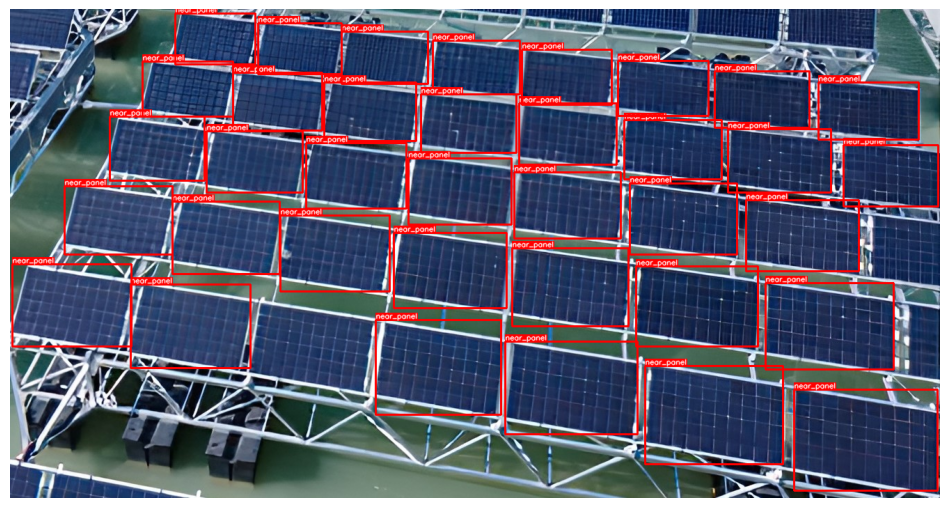

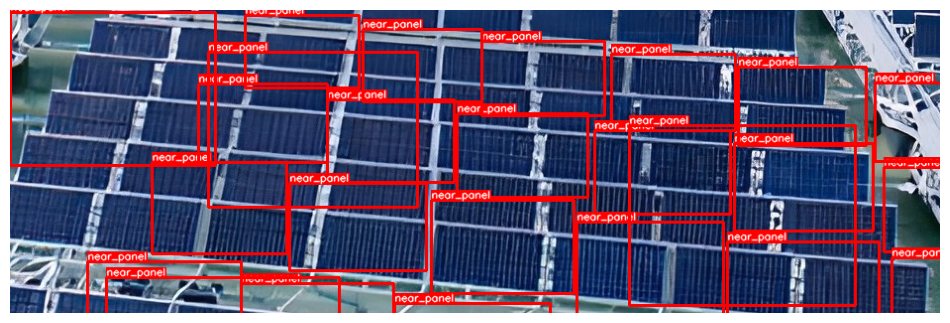

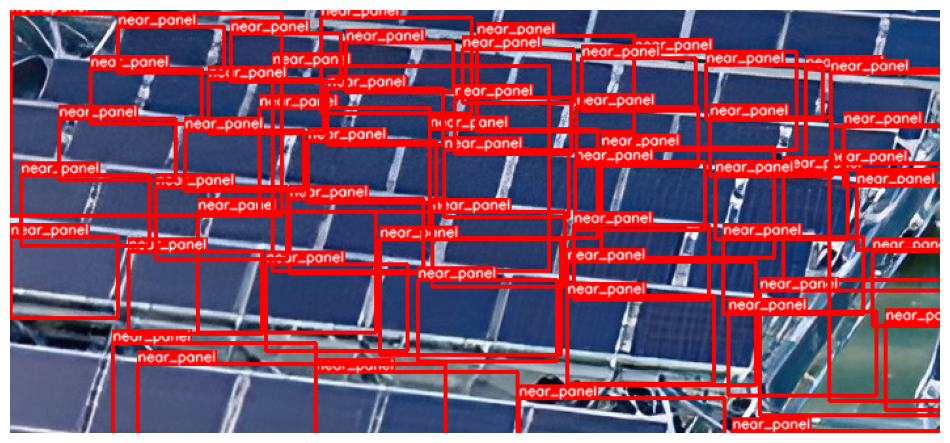

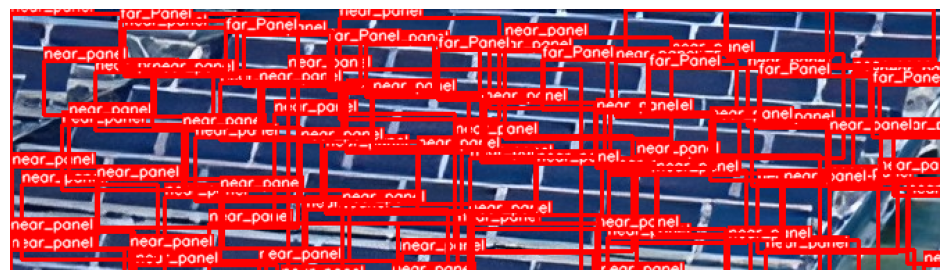

In [14]:
import json
image_id_lst  = list(range(1,6))
our_file = "/kaggle/input/data-para-results/4000_par.json"
    # Assuming you have a JSON file named 'data.json' containing JSON data

file_lst  = ["enlarge_given_image (1)","enlarge_given_image (3)","enlarge_given_image (4)","enlarge_given_image (5)"]
path_to_files = "/kaggle/input/coco-solar/soure_1/soure/train_old/"
print(len(image_id_lst), len(file_lst))

with open(our_file, 'r') as json_file:
    data = json.load(json_file)
    bbox_lst = []
    category_ids_lst = []

for image_id, file in zip(image_id_lst, file_lst):
    for out_dict in data:
        #print(out_dict)
        if out_dict["image_id"] == image_id:
            bbox_lst.append(out_dict["bbox"])
            category_ids_lst.append(out_dict['category_id'])
    print(len(category_ids_lst))
    category_id_to_name = {1: 'far_Panel', 2: 'near_panel'}
    print(image_id, file)
    file_path = str(path_to_files) + str(file) +'.jpg' 
    print(f"filepath = {file_path}")
    image = cv2.imread(file_path)
    print(f"image_shape={image.shape}")
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    # visualize(image, bboxes, category_ids, category_id_to_name)
    visualize(image, bbox_lst, category_ids_lst, category_id_to_name)

**Final_prediction**

66


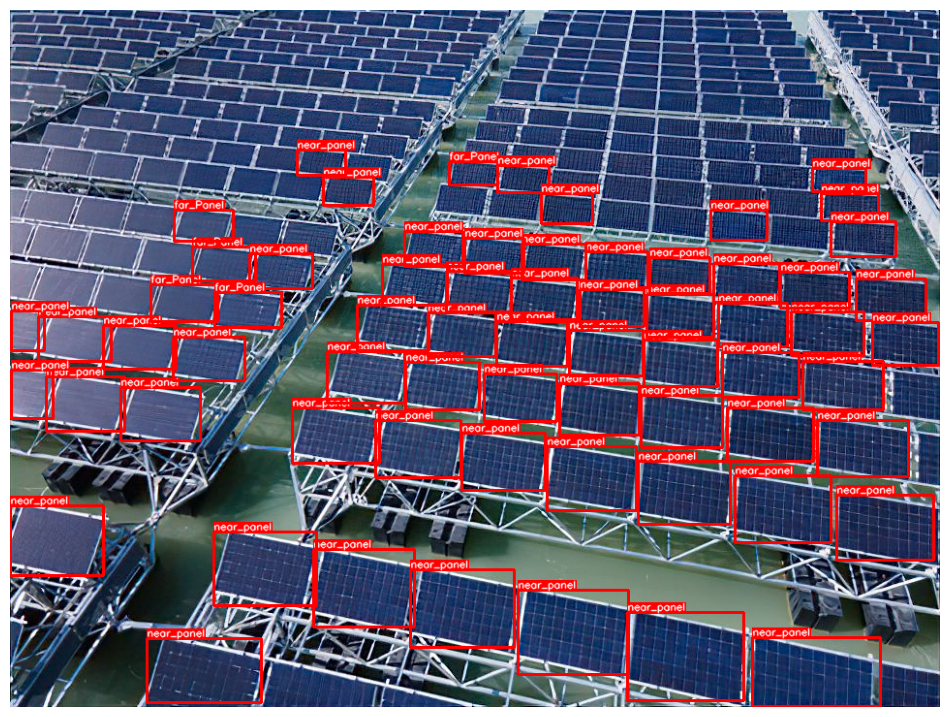

In [15]:
import json
# image_id_lst  = list(range(1))
image_id_lst  = list(range(1))

# for image_id in image_id_lst:
our_file = "/kaggle/input/data-para-results/threshold_4.json"
# Assuming you have a JSON file named 'data.json' containing JSON data
with open(our_file, 'r') as json_file:
    data = json.load(json_file)
bbox_lst = []
category_ids_lst = []
for out_dict in data:
    if out_dict["image_id"] == 1:
        bbox_lst.append(out_dict["bbox"])
        category_ids_lst.append(out_dict['category_id'])
print(len(category_ids_lst))
category_id_to_name = {1: 'far_Panel', 2: 'near_panel'}

image = cv2.imread('/kaggle/input/evaluate/enlarge_given_image.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# visualize(image, bboxes, category_ids, category_id_to_name)
visualize(image, bbox_lst, category_ids_lst, category_id_to_name)

100


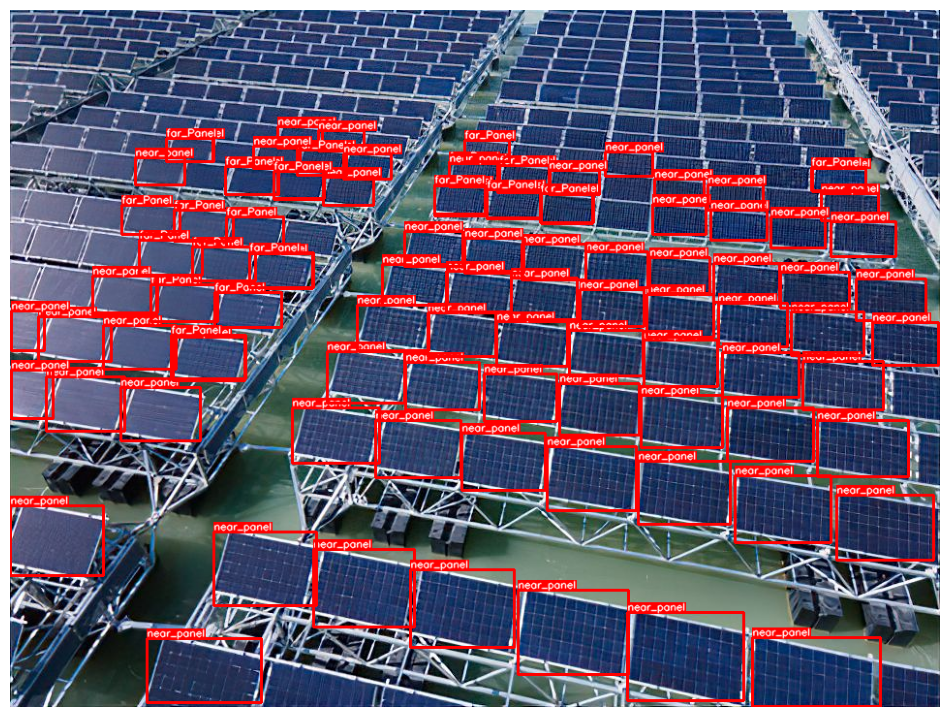

In [16]:
import json
# image_id_lst  = list(range(1))
image_id_lst  = list(range(1))

# for image_id in image_id_lst:
our_file = "/kaggle/input/data-para-results/thershold_01.json"
# Assuming you have a JSON file named 'data.json' containing JSON data
with open(our_file, 'r') as json_file:
    data = json.load(json_file)
bbox_lst = []
category_ids_lst = []
for out_dict in data:
    if out_dict["image_id"] == 1:
        bbox_lst.append(out_dict["bbox"])
        category_ids_lst.append(out_dict['category_id'])
print(len(category_ids_lst))
category_id_to_name = {1: 'far_Panel', 2: 'near_panel'}

image = cv2.imread('/kaggle/input/evaluate/enlarge_given_image.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# visualize(image, bboxes, category_ids, category_id_to_name)
visualize(image, bbox_lst, category_ids_lst, category_id_to_name)

139


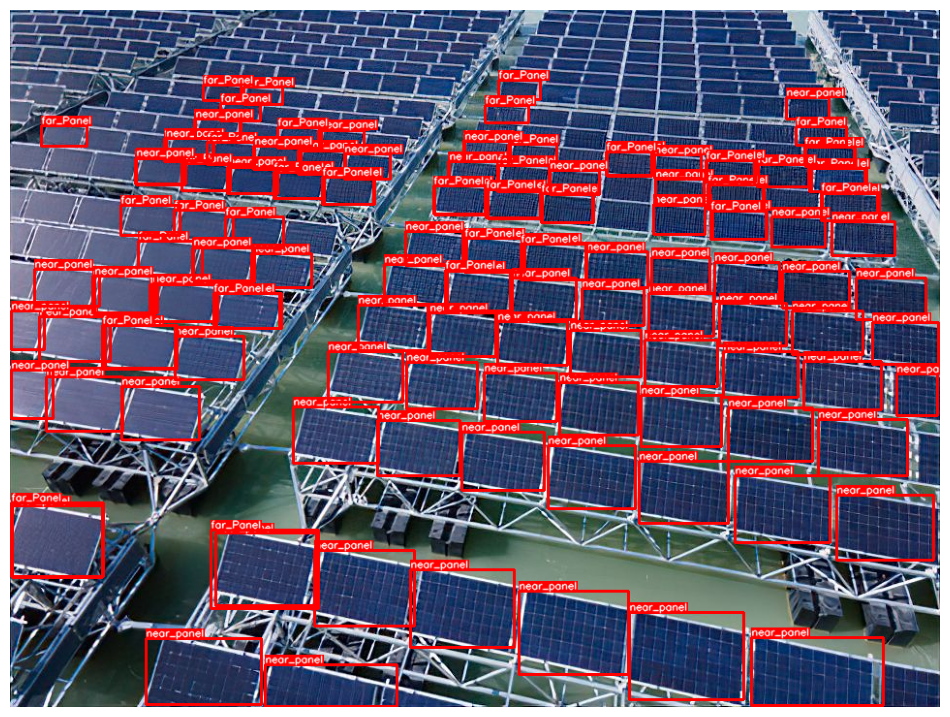

In [17]:
import json
# image_id_lst  = list(range(1))
image_id_lst  = list(range(1))

# for image_id in image_id_lst:
our_file = "/kaggle/input/data-para-results/trian_350.json"
# Assuming you have a JSON file named 'data.json' containing JSON data
with open(our_file, 'r') as json_file:
    data = json.load(json_file)
bbox_lst = []
category_ids_lst = []
for out_dict in data:
    if out_dict["image_id"] == 1:
        bbox_lst.append(out_dict["bbox"])
        category_ids_lst.append(out_dict['category_id'])
print(len(category_ids_lst))
category_id_to_name = {1: 'far_Panel', 2: 'near_panel'}

image = cv2.imread('/kaggle/input/evaluate/enlarge_given_image.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# visualize(image, bboxes, category_ids, category_id_to_name)
visualize(image, bbox_lst, category_ids_lst, category_id_to_name)

223


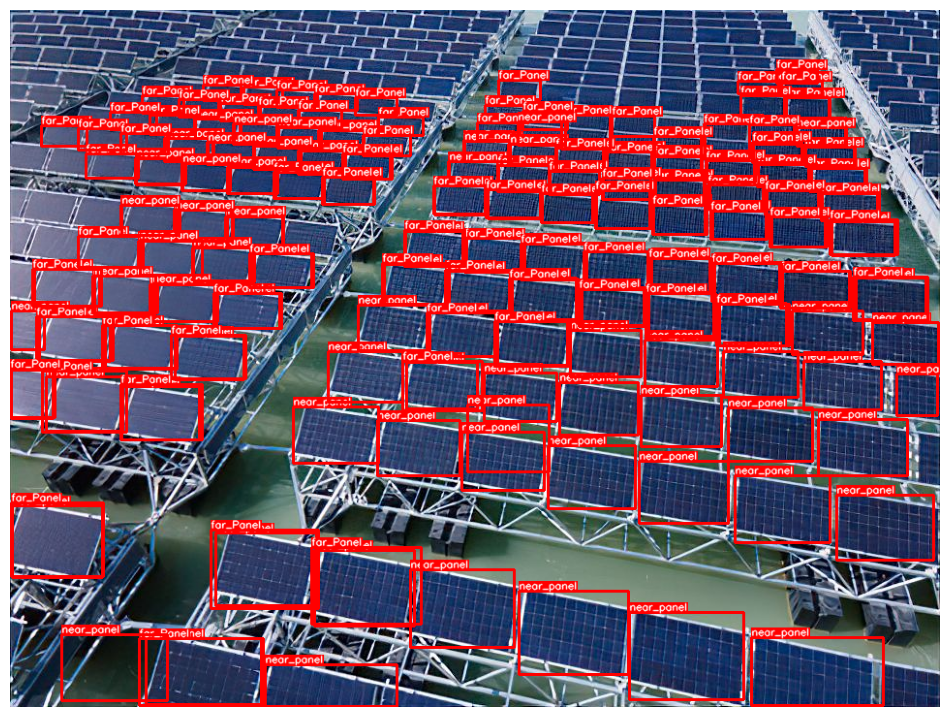

In [18]:
import json
# image_id_lst  = list(range(1))
image_id_lst  = list(range(1))

# for image_id in image_id_lst:
our_file = "/kaggle/input/data-para-results/train_001.json"
# Assuming you have a JSON file named 'data.json' containing JSON data
with open(our_file, 'r') as json_file:
    data = json.load(json_file)
bbox_lst = []
category_ids_lst = []
for out_dict in data:
    if out_dict["image_id"] == 1:
        bbox_lst.append(out_dict["bbox"])
        category_ids_lst.append(out_dict['category_id'])
print(len(category_ids_lst))
category_id_to_name = {1: 'far_Panel', 2: 'near_panel'}

image = cv2.imread('/kaggle/input/evaluate/enlarge_given_image.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# visualize(image, bboxes, category_ids, category_id_to_name)
visualize(image, bbox_lst, category_ids_lst, category_id_to_name)